In [1]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from data_processing import dataset
from models import model
from utils import tools
from plots import plots, edge_detection_plots

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
#np.set_printoptions(threshold=sys.maxsize)

2022-12-13 13:51:51.879397: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-13 13:51:51.972428: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-12-13 13:51:51.994032: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-12-13 13:51:52.407952: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
config_directory = 'flow'

config_path = os.path.join(os.getcwd(), 'configs', config_directory)
Model = model.Model(config_path)
DataProcessing = dataset.DataProcessing(input_shape_img=Model.cfg["INPUT_SHAPE_IMG"],
                                        input_shape_mask=Model.cfg["INPUT_SHAPE_MASK"],
                                        output_shape=Model.cfg["OUTPUT_SHAPE"],
                                        config_path=config_path)
tools.parser(Model.cfg, DataProcessing.cfg)
Model.load_data(DataProcessing.cfg["NAME"])
DataProcessing.path_definitions()

2022-12-13 13:51:53.632409: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 13:51:53.636915: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 13:51:53.637015: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 13:51:53.637787: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

# Load Dataset, Preprocess Images and Dataset

The TRAIN DS contains 185 images.
The TEST DS contains 51 images.


2022-12-13 13:51:55.084184: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


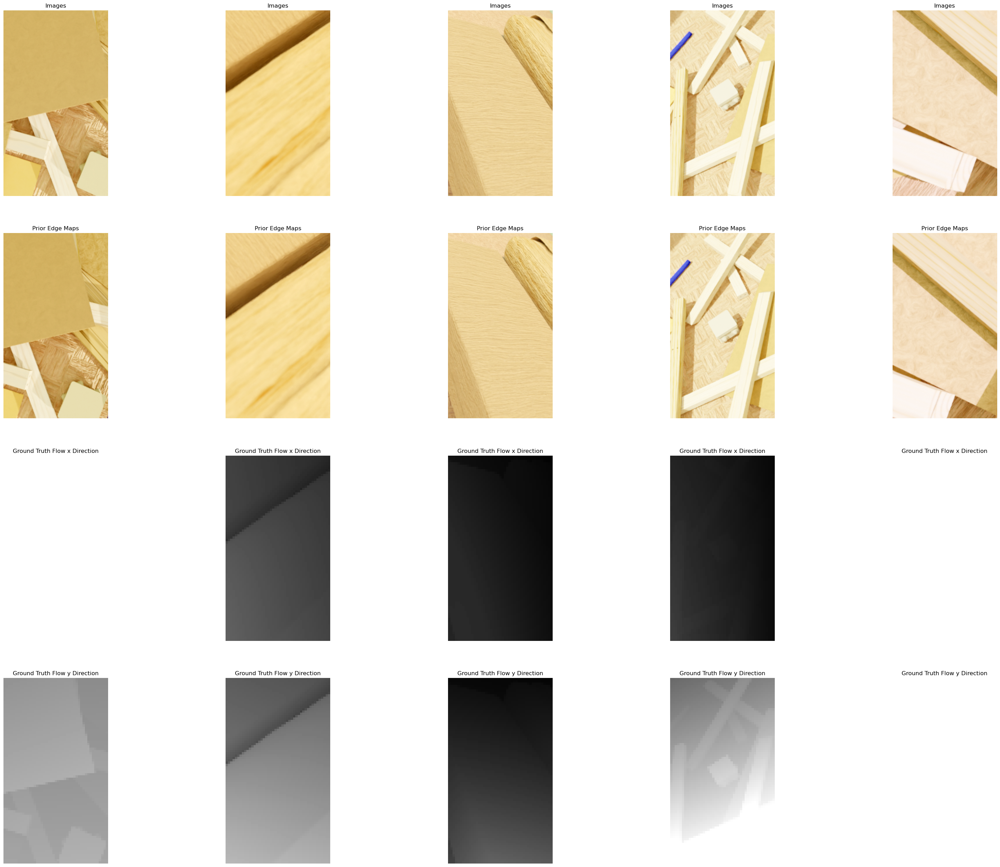

In [3]:
if Model.train_model:
    train_ds, img_count_train = DataProcessing.load_dataset(DataProcessing.key.train)
test_ds, img_count_test = DataProcessing.load_dataset(DataProcessing.key.test)

if Model.train_model:
    for inp, out in test_ds.take(1):
        edge_detection_plots.plot_flow_field(images=inp['in_img'], 
                                             prior = inp['in_prior_img'],
                                             flow_ground_truth=out['out_flow'], 
                                             batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])
        #edge_detection_plots.plot_edges(images=inp['in_img'],
        #                                prior = inp['in_edge'],
        #                                batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
        #                                num_classes=DataProcessing.num_classes['edge'])

# Define, Compile and Train Model

In [4]:
if Model.train_model:
    model = Model.get_neural_network_model(0)
    # model.summary()

    lr = Model.get_lr(img_count_train, DataProcessing.cfg['TRAIN']['BATCH_SIZE'])
    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=Model.get_loss_function(),
                  metrics=Model.get_metrics(0))

    history = model.fit(train_ds, epochs=Model.cfg["EPOCHS"], validation_data=train_ds,
                        callbacks=Model.get_callbacks(), verbose=1)

model = Model.get_best_model_from_checkpoints()

Epoch 1/2000


2022-12-13 13:51:57.563695: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2022-12-13 13:51:58.869367: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


37/37 [==============================] - 5s 42ms/step - loss: 17.3589 - val_loss: 17.3104
Epoch 2/2000
37/37 [==============================] - 1s 25ms/step - loss: 17.3134 - val_loss: 17.3084
Epoch 3/2000
37/37 [==============================] - 1s 25ms/step - loss: 17.3125 - val_loss: 17.3033
Epoch 4/2000
37/37 [==============================] - 1s 25ms/step - loss: 17.3138 - val_loss: 17.2939
Epoch 5/2000
37/37 [==============================] - 1s 25ms/step - loss: 17.3330 - val_loss: 17.2741
Epoch 6/2000
37/37 [==============================] - 1s 25ms/step - loss: 17.2835 - val_loss: 17.2458
Epoch 7/2000
37/37 [==============================] - 1s 25ms/step - loss: 17.2840 - val_loss: 17.2482
Epoch 8/2000
37/37 [==============================] - 1s 26ms/step - loss: 17.2737 - val_loss: 17.1667
Epoch 9/2000
37/37 [==============================] - 1s 26ms/step - loss: 17.3312 - val_loss: 17.2419
Epoch 10/2000
37/37 [==============================] - 1s 26ms/step - loss: 17.2747 - 

Epoch 80/2000
37/37 [==============================] - 1s 26ms/step - loss: 14.2124 - val_loss: 15.9019
Epoch 81/2000
37/37 [==============================] - 1s 25ms/step - loss: 15.0062 - val_loss: 14.2961
Epoch 82/2000
37/37 [==============================] - 1s 25ms/step - loss: 14.3873 - val_loss: 13.7512
Epoch 83/2000
37/37 [==============================] - 1s 26ms/step - loss: 13.8672 - val_loss: 13.7288
Epoch 84/2000
37/37 [==============================] - 1s 26ms/step - loss: 14.0147 - val_loss: 13.6309
Epoch 85/2000
37/37 [==============================] - 1s 25ms/step - loss: 13.9963 - val_loss: 13.8582
Epoch 86/2000
37/37 [==============================] - 1s 25ms/step - loss: 14.5447 - val_loss: 15.1191
Epoch 87/2000
37/37 [==============================] - 1s 25ms/step - loss: 14.8959 - val_loss: 14.1937
Epoch 88/2000
37/37 [==============================] - 1s 25ms/step - loss: 14.1059 - val_loss: 13.5988
Epoch 89/2000
37/37 [==============================] - 1s 25ms/s

37/37 [==============================] - 1s 27ms/step - loss: 9.9152 - val_loss: 10.0196
Epoch 159/2000
37/37 [==============================] - 1s 26ms/step - loss: 10.0493 - val_loss: 10.0179
Epoch 160/2000
37/37 [==============================] - 1s 25ms/step - loss: 10.1405 - val_loss: 9.7795
Epoch 161/2000
37/37 [==============================] - 1s 25ms/step - loss: 9.7553 - val_loss: 9.5766
Epoch 162/2000
37/37 [==============================] - 1s 26ms/step - loss: 9.6444 - val_loss: 9.5221
Epoch 163/2000
37/37 [==============================] - 1s 25ms/step - loss: 9.9630 - val_loss: 9.6861
Epoch 164/2000
37/37 [==============================] - 1s 25ms/step - loss: 9.8549 - val_loss: 9.2956
Epoch 165/2000
37/37 [==============================] - 1s 25ms/step - loss: 9.3843 - val_loss: 9.0017
Epoch 166/2000
37/37 [==============================] - 1s 26ms/step - loss: 9.4777 - val_loss: 9.2379
Epoch 167/2000
37/37 [==============================] - 1s 25ms/step - loss: 9.2856 

37/37 [==============================] - 1s 26ms/step - loss: 5.1888 - val_loss: 4.8288
Epoch 238/2000
37/37 [==============================] - 1s 26ms/step - loss: 5.0689 - val_loss: 5.4400
Epoch 239/2000
37/37 [==============================] - 1s 26ms/step - loss: 5.1229 - val_loss: 4.7900
Epoch 240/2000
37/37 [==============================] - 1s 25ms/step - loss: 5.3804 - val_loss: 5.6510
Epoch 241/2000
37/37 [==============================] - 1s 25ms/step - loss: 5.6151 - val_loss: 5.1279
Epoch 242/2000
37/37 [==============================] - 1s 25ms/step - loss: 5.1149 - val_loss: 5.0372
Epoch 243/2000
37/37 [==============================] - 1s 25ms/step - loss: 4.7382 - val_loss: 4.4110
Epoch 244/2000
37/37 [==============================] - 1s 25ms/step - loss: 4.5619 - val_loss: 4.4326
Epoch 245/2000
37/37 [==============================] - 1s 25ms/step - loss: 4.5386 - val_loss: 4.3854
Epoch 246/2000
37/37 [==============================] - 1s 25ms/step - loss: 5.3981 - va

37/37 [==============================] - 1s 26ms/step - loss: 2.3546 - val_loss: 2.2225
Epoch 317/2000
37/37 [==============================] - 1s 26ms/step - loss: 2.5328 - val_loss: 2.4524
Epoch 318/2000
37/37 [==============================] - 1s 28ms/step - loss: 2.8358 - val_loss: 2.9568
Epoch 319/2000
37/37 [==============================] - 1s 26ms/step - loss: 2.9871 - val_loss: 2.8793
Epoch 320/2000
37/37 [==============================] - 1s 26ms/step - loss: 3.1625 - val_loss: 3.3726
Epoch 321/2000
37/37 [==============================] - 1s 27ms/step - loss: 4.0098 - val_loss: 3.2349
Epoch 322/2000
37/37 [==============================] - 1s 26ms/step - loss: 3.3376 - val_loss: 3.1970
Epoch 323/2000
37/37 [==============================] - 1s 26ms/step - loss: 3.0741 - val_loss: 3.1517
Epoch 324/2000
37/37 [==============================] - 1s 26ms/step - loss: 2.9267 - val_loss: 2.3377
Epoch 325/2000
37/37 [==============================] - 1s 26ms/step - loss: 2.3366 - va

37/37 [==============================] - 1s 25ms/step - loss: 2.0378 - val_loss: 2.1397
Epoch 396/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.9158 - val_loss: 1.7308
Epoch 397/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.6213 - val_loss: 1.7325
Epoch 398/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.6382 - val_loss: 1.6774
Epoch 399/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.8863 - val_loss: 2.1750
Epoch 400/2000
37/37 [==============================] - 1s 25ms/step - loss: 2.1913 - val_loss: 1.8925
Epoch 401/2000
37/37 [==============================] - 1s 25ms/step - loss: 2.0018 - val_loss: 1.8391
Epoch 402/2000
37/37 [==============================] - 1s 25ms/step - loss: 2.4814 - val_loss: 2.1525
Epoch 403/2000
37/37 [==============================] - 1s 25ms/step - loss: 2.3363 - val_loss: 2.0896
Epoch 404/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.8686 - va

37/37 [==============================] - 1s 25ms/step - loss: 2.4767 - val_loss: 2.1810
Epoch 475/2000
37/37 [==============================] - 1s 25ms/step - loss: 2.2218 - val_loss: 1.8003
Epoch 476/2000
37/37 [==============================] - 1s 26ms/step - loss: 2.1270 - val_loss: 2.1199
Epoch 477/2000
37/37 [==============================] - 1s 26ms/step - loss: 2.0441 - val_loss: 1.7075
Epoch 478/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.7146 - val_loss: 1.5121
Epoch 479/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.5090 - val_loss: 1.3404
Epoch 480/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.5828 - val_loss: 2.2977
Epoch 481/2000
37/37 [==============================] - 1s 26ms/step - loss: 2.1126 - val_loss: 1.5695
Epoch 482/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.4853 - val_loss: 1.6524
Epoch 483/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.6690 - va

37/37 [==============================] - 1s 25ms/step - loss: 0.9958 - val_loss: 1.3311
Epoch 554/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.0995 - val_loss: 1.0055
Epoch 555/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.0175 - val_loss: 0.9755
Epoch 556/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.0620 - val_loss: 0.7835
Epoch 557/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.9986 - val_loss: 0.9606
Epoch 558/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.9749 - val_loss: 1.2541
Epoch 559/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.1057 - val_loss: 1.0938
Epoch 560/2000
37/37 [==============================] - 1s 25ms/step - loss: 1.0610 - val_loss: 0.8552
Epoch 561/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.9670 - val_loss: 0.9495
Epoch 562/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.9423 - va

37/37 [==============================] - 1s 26ms/step - loss: 0.8549 - val_loss: 0.9934
Epoch 633/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.7871 - val_loss: 0.6990
Epoch 634/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.7963 - val_loss: 0.6996
Epoch 635/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.7578 - val_loss: 0.7574
Epoch 636/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.8166 - val_loss: 0.9328
Epoch 637/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.0418 - val_loss: 1.0561
Epoch 638/2000
37/37 [==============================] - 1s 27ms/step - loss: 0.8290 - val_loss: 0.8298
Epoch 639/2000
37/37 [==============================] - 1s 27ms/step - loss: 0.7550 - val_loss: 0.7040
Epoch 640/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.8271 - val_loss: 0.7444
Epoch 641/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.7992 - va

37/37 [==============================] - 1s 26ms/step - loss: 0.8550 - val_loss: 0.8084
Epoch 712/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.7036 - val_loss: 0.7219
Epoch 713/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.0568 - val_loss: 1.2117
Epoch 714/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.3990 - val_loss: 1.1194
Epoch 715/2000
37/37 [==============================] - 1s 26ms/step - loss: 2.0324 - val_loss: 1.5952
Epoch 716/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.5759 - val_loss: 1.5309
Epoch 717/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.5199 - val_loss: 1.8113
Epoch 718/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.4607 - val_loss: 1.3255
Epoch 719/2000
37/37 [==============================] - 1s 26ms/step - loss: 1.0814 - val_loss: 1.0031
Epoch 720/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.9408 - va

37/37 [==============================] - 1s 26ms/step - loss: 0.7955 - val_loss: 0.7008
Epoch 791/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.7722 - val_loss: 0.6548
Epoch 792/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.6480 - val_loss: 0.6542
Epoch 793/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.9813 - val_loss: 1.0102
Epoch 794/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.6609 - val_loss: 0.5204
Epoch 795/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.5618 - val_loss: 0.5161
Epoch 796/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.5227 - val_loss: 0.3962
Epoch 797/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.4545 - val_loss: 0.5050
Epoch 798/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.6417 - val_loss: 1.1580
Epoch 799/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.7270 - va

37/37 [==============================] - 1s 25ms/step - loss: 0.9048 - val_loss: 0.7191
Epoch 870/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.7218 - val_loss: 0.7975
Epoch 871/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.6498 - val_loss: 0.7768
Epoch 872/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.5657 - val_loss: 0.4902
Epoch 873/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.5554 - val_loss: 0.7656
Epoch 874/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.5256 - val_loss: 0.6965
Epoch 875/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.5221 - val_loss: 0.5198
Epoch 876/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.4862 - val_loss: 0.6821
Epoch 877/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.7276 - val_loss: 0.8066
Epoch 878/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.6750 - va

37/37 [==============================] - 1s 28ms/step - loss: 0.9736 - val_loss: 0.7382
Epoch 949/2000
37/37 [==============================] - 1s 28ms/step - loss: 0.8175 - val_loss: 0.6933
Epoch 950/2000
37/37 [==============================] - 1s 28ms/step - loss: 0.6606 - val_loss: 0.9736
Epoch 951/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.6377 - val_loss: 0.5580
Epoch 952/2000
37/37 [==============================] - 1s 28ms/step - loss: 0.6222 - val_loss: 0.6094
Epoch 953/2000
37/37 [==============================] - 1s 27ms/step - loss: 0.5813 - val_loss: 0.6293
Epoch 954/2000
37/37 [==============================] - 1s 27ms/step - loss: 0.5602 - val_loss: 0.5082
Epoch 955/2000
37/37 [==============================] - 1s 27ms/step - loss: 0.4744 - val_loss: 0.5661
Epoch 956/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.5022 - val_loss: 0.5221
Epoch 957/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.5271 - va

37/37 [==============================] - 1s 25ms/step - loss: 0.3233 - val_loss: 0.2900
Epoch 1028/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.3464 - val_loss: 0.4141
Epoch 1029/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.3626 - val_loss: 0.3983
Epoch 1030/2000
37/37 [==============================] - 1s 27ms/step - loss: 0.5078 - val_loss: 0.3815
Epoch 1031/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.3564 - val_loss: 0.3269
Epoch 1032/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.3377 - val_loss: 0.3751
Epoch 1033/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.3905 - val_loss: 0.4157
Epoch 1034/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.4041 - val_loss: 0.3380
Epoch 1035/2000
37/37 [==============================] - 1s 26ms/step - loss: 0.3447 - val_loss: 0.3910
Epoch 1036/2000
37/37 [==============================] - 1s 25ms/step - loss: 0.

KeyboardInterrupt: 

1/1 [==============================] - 0s 16ms/step


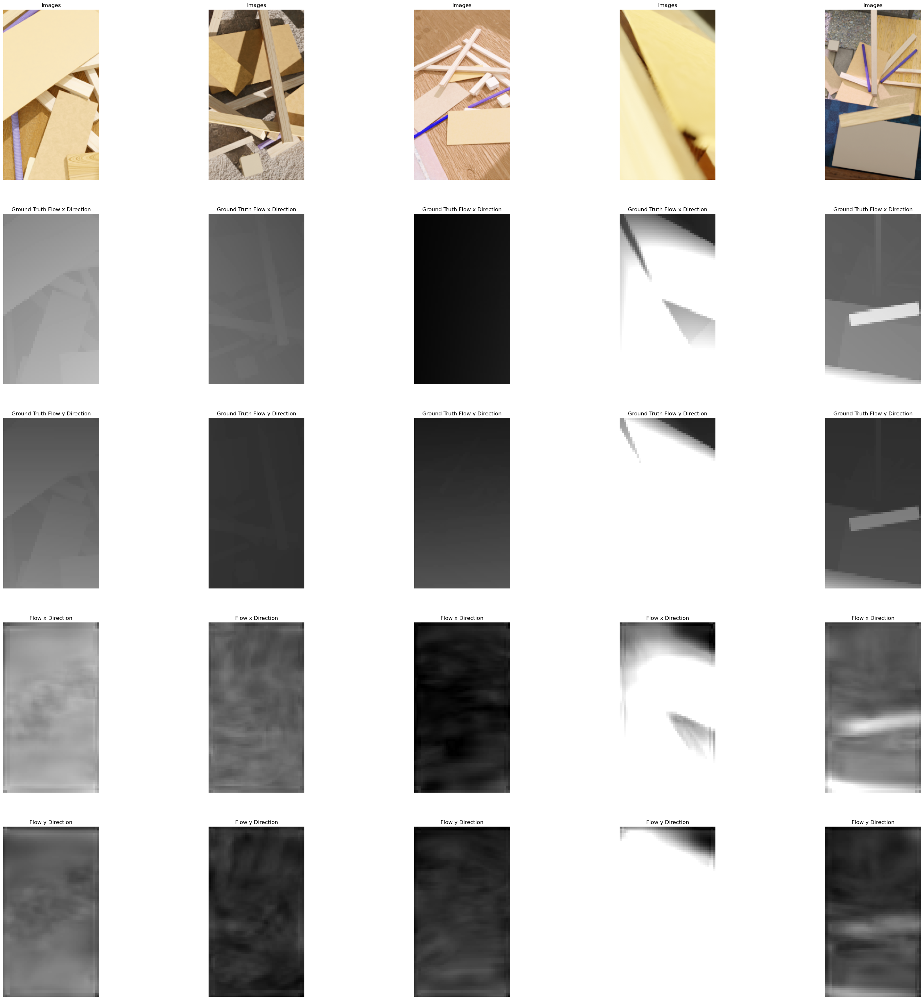

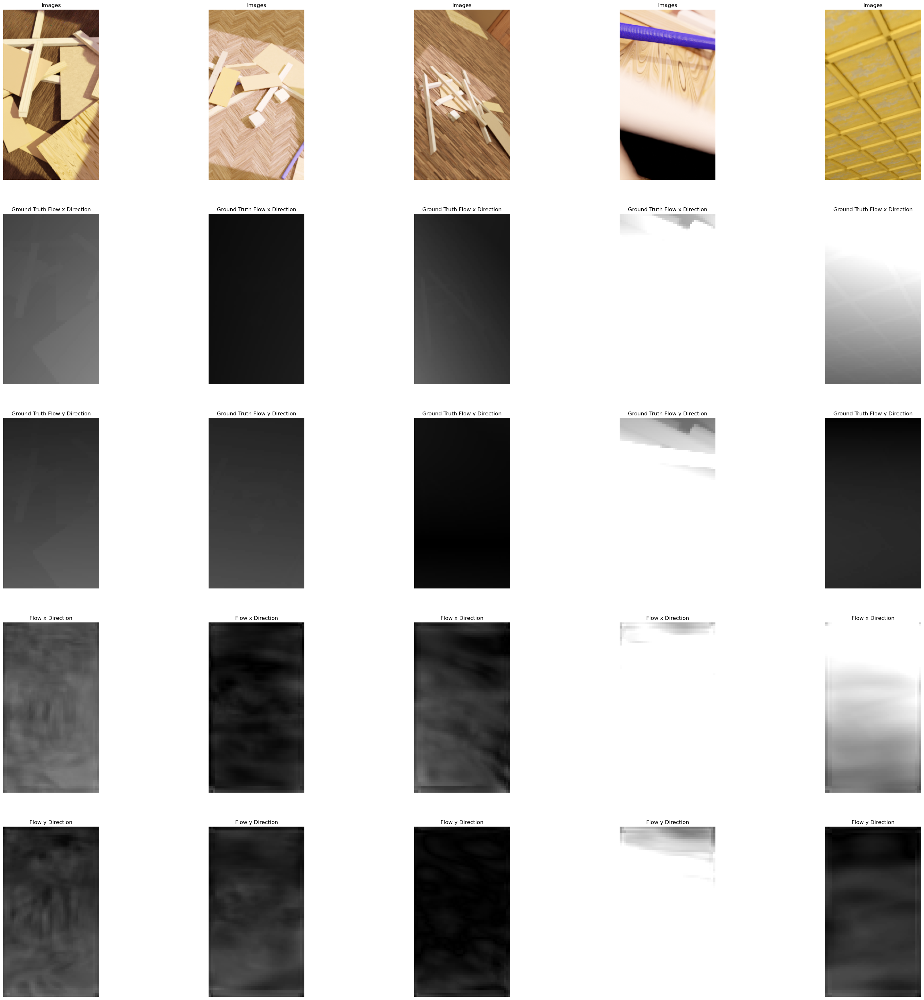

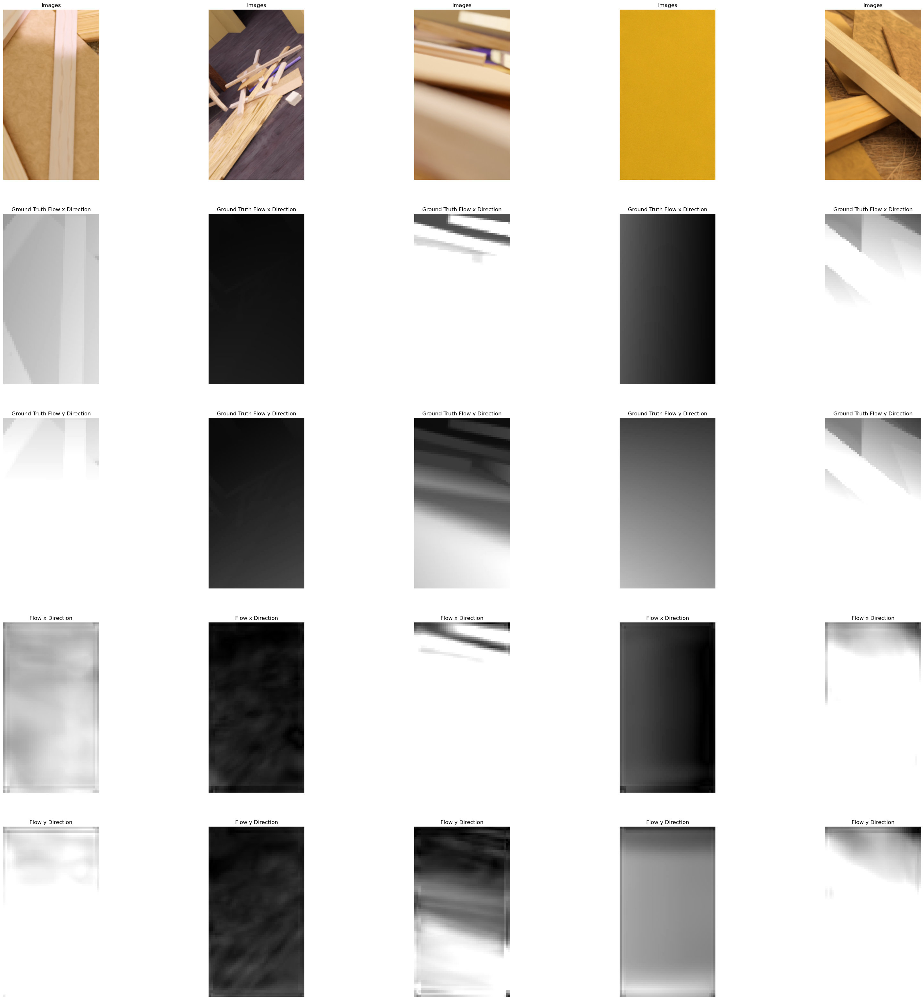

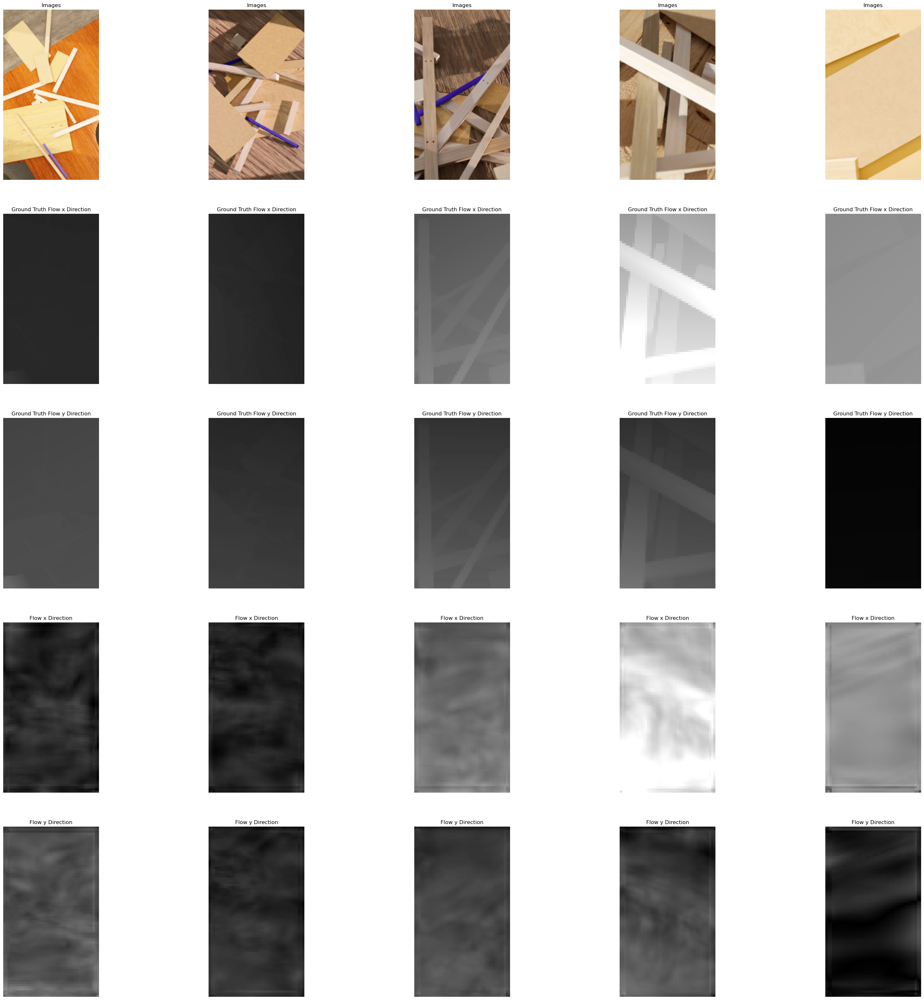

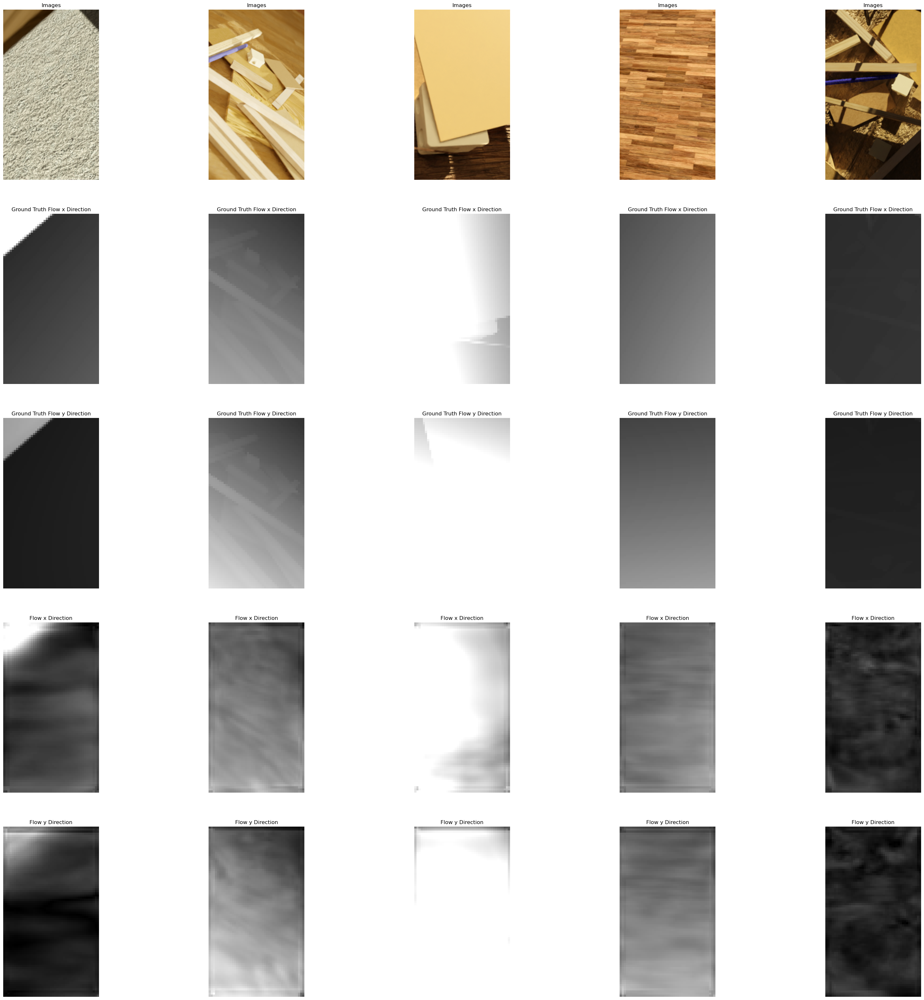

In [8]:
for inp, out in train_ds.take(5):
    pred = model.predict(inp)
    edge_detection_plots.plot_flow_field(images=inp['in_img'], 
                                         flow_ground_truth=out['out_flow'],
                                         flow_prediction=pred,
                                         batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])

In [9]:
model.summary()


tf.keras.utils.plot_model(
    model,
    to_file=Model.Data.paths['FIGURES']+"/model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in_img (InputLayer)            [(None, 320, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 in_prior_img (InputLayer)      [(None, 320, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate (Concatenate)      (None, 320, 180, 6)  0           ['in_img[0][0]',                 
                                                                  'in_prior_img[0][0]']       

                                                                                                  
 concatenate_2 (Concatenate)    (None, 80, 45, 120)  0           ['tf.image.resize_1[0][0]',      
                                                                  'tf.image.resize_2[0][0]']      
                                                                                                  
 out_1_separable_conv (Separabl  (None, 80, 45, 24)  3024        ['concatenate_2[0][0]']          
 eConv2D)                                                                                         
                                                                                                  
 out_1_relu (ReLU)              (None, 80, 45, 24)   0           ['out_1_separable_conv[0][0]']   
                                                                                                  
 out_2_separable_conv (Separabl  (None, 80, 45, 8)   1376        ['out_1_relu[0][0]']             
 eConv2D) 

# Plot Results

In [7]:
if Model.train_model:
    plot_losses = ["loss", "loss"]
    plot_metrics = ["accuracy", "f1", "recall", "precision"]

    path = os.path.join(Model.Data.paths["FIGURES"], "training.svg")

    plots.plot_training_history(history=history.history, list_of_loss_names=plot_losses,
                                list_of_metric_names=plot_metrics,
                                save=Model.cfg["SAVE"], path=path)

NameError: name 'history' is not defined

In [ ]:
for inp, out in test_ds.take(1):
    pred = model.predict(inp)
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    labels=out['out_edge'],
                                    predictions=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                    num_classes=DataProcessing.num_classes['edge'])

In [ ]:
### Maximum F1 Score:
path_metrics_evaluation_plot = os.path.join(Model.Data.paths["FIGURES"],
                                            "threshold_metrics_evaluation_test_ds.svg")

edge_detection_plots.plot_threshold_metrics_evaluation(model=model, ds=test_ds,
                                                       num_classes=DataProcessing.num_classes['edge'],
                                                       classes_displayed_individually=True,
                                                       save=Model.cfg["SAVE"],
                                                       path=path_metrics_evaluation_plot,
                                                       accuracy_y_lim_min=0.8)


In [ ]:
if Model.cfg["CONVERT_TO_TFLITE"]:
    Model.convert_model_to_tflite(model)